# Set up

Load pycodestyle (PEP8) :

In [1]:
# %load_ext pycodestyle_magic

In [2]:
# %pycodestyle_on --max_line_length 125  # GitHub limit

Python librairies imports :

In [3]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

import seaborn as sns

from math import radians, cos, sin, asin, sqrt

import missingno as msno

import folium

%matplotlib inline
sns.set_theme(palette="tab10")

Mount Google Drive :

In [4]:
work_loc = 'local'  # colab or local

project_path = "My Drive/OPENCLASSROOMS/Projets DATA/5. Segmentation ecommerce"

if (work_loc == 'colab'):
    # Mount Drive folder
    from google.colab import drive
    drive.mount('/content/drive')

    # Google Drive path
    work_path = "/content/drive/"

elif (work_loc == 'local'):
    # Local drive path
    work_path = "/Users/victor/Library/CloudStorage/GoogleDrive-vicozer@gmail.com/"

else:
    raise ValueError("Choose between 'colab' or 'local' work!")

Load data :

In [5]:
# Load customers data
customers_data = pd.read_csv(work_path + project_path + "/olist_customers_dataset.csv")

# Load geolocation data
geolocation_data = pd.read_csv(work_path + project_path + "/olist_geolocation_dataset.csv")

# Load order items data
order_items_data = pd.read_csv(work_path + project_path + "/olist_order_items_dataset.csv")

# Load order payments data
order_payments_data = pd.read_csv(work_path + project_path + "/olist_order_payments_dataset.csv")

# Load order reviews data
order_reviews_data = pd.read_csv(work_path + project_path + "/olist_order_reviews_dataset.csv")

# Load orders data
orders_data = pd.read_csv(work_path + project_path + "/olist_orders_dataset.csv")

# Load products data
products_data = pd.read_csv(work_path + project_path + "/olist_products_dataset.csv")

# Load sellers data
sellers_data = pd.read_csv(work_path + project_path + "/olist_sellers_dataset.csv")

# Load translation data
translation_data = pd.read_csv(work_path + project_path + "/product_category_name_translation.csv")

# Functions

## Plots functions

In [6]:
# Display countplot
def display_countplot(data, x=None, y=None, title='Countplot', figsize=(12, 8),
                      order=None):
    plt.figure(figsize=figsize)
    plt.title(title)
    sns.countplot(data=data, x=x, y=y, order=order)
    plt.show()


In [7]:
# Display multi histplot
def display_multi_histplot(data, columns=None, title='Histplots', figsize=(25,20), 
                           kde=True):
    # Define columns
    if columns is None:
        columns=data.columns.to_list()
    columns_n = len(columns)

    # Compute size of plot
    if(columns_n < 4):
        fig_x = columns_n
        fig_y = 1
    elif(columns_n == 4):
        fig_x = 2
        fig_y = 2
    elif(columns_n < 6):
        fig_x = 4
        fig_y = 2
    else:
        fig_x = columns_n//3
        fig_y = 3
        if(columns_n%3 > 0): fig_x = fig_x + 1
    
    # Init fig
    fig, ax = plt.subplots(fig_x, fig_y, figsize=figsize)
    i, j = 0, 0

    # Title 
    plt.suptitle(title, fontsize=15)

    # Loop on columns
    for col in columns:
        if(fig_y==1):
            ax_ = ax[i]
        else:
            ax_ = ax[i,j]
        sns.histplot(x=col, data=data, kde=kde, ax=ax_)
        # Manage grid
        j += 1
        if(j > (fig_y - 1)): 
            j = 0
            i += 1

    # plt.tight_layout()
    plt.show()

In [8]:
# Display heatmap
def display_heatmap(data, title="Heatmap", annot=True, figsize=(12, 8)):
    plt.figure(figsize=figsize)
    plt.title("Correlation matrix of energy uses")
    mask = np.zeros_like(data)
    mask[np.triu_indices_from(mask)] = True
    sns.heatmap(data.abs(), mask=mask, cmap='RdBu_r', annot=annot)
    plt.show()

## Apply functions

In [9]:
# Apply function haversine distance
def apply_seller_haversine_distance(row):
    lat1 = row['customer_latitude']
    lng1 = row['customer_longitude']
    lat2 = row['seller_latitude']
    lng2 = row['seller_longitude']
    distance = haversine_distance(lat1, lng1, lat2, lng2)
    return distance

In [10]:
# Apply function payment type value
def apply_payment_type_value(row, payment_type):
    row_type = row['payment_type']
    row_value = row['payment_value']
    payment_type_value = row_value if (payment_type == row_type) else 0
    return payment_type_value

In [11]:
# Apply function product type from dictionary
def apply_new_category(current_type, **dictionary):
    new_type = 'NOT_FOUND'

    if (type(current_type) == int) or (type(current_type) == float):
        new_type = np.nan

    else:
        for dict_type, dict_type_list in dictionary.items():
            if current_type in dict_type_list:
                new_type = dict_type
                break

    return new_type

In [12]:
# Apply function to add a point on a folium map
def apply_circle_to_map(row, background_map, color='blue'):
    x = row.iloc[0]
    y = row.iloc[1]
    folium.Circle([x, y], color=color, radius=100).add_to(background_map)

## Math functions

In [13]:
# Compute harvsine distance between two locations
# See https://www.movable-type.co.uk/scripts/latlong.html for the formula
def haversine_distance(lat1, lng1, lat2, lng2, degrees=True):
    earth_radius = 6371000  # Meters

    # Cast to radians
    if degrees:
        lat1, lng1, lat2, lng2 = map(radians, [lat1, lng1, lat2, lng2])

    # Haversine formula
    delta_lng = lng2 - lng1
    delta_lat = lat2 - lat1
    a = sin(delta_lat/2)**2 + cos(lat1) * cos(lat2) * sin(delta_lng/2)**2
    distance = 2 * earth_radius * asin(sqrt(a))

    return distance

# Datasets analysis

### General information

Create list of all datasets.

In [14]:
# Olist data
olist_data = [('customers', customers_data),
              ('geolocation', geolocation_data),
              ('order_items', order_items_data),
              ('order_payments', order_payments_data),
              ('order_reviews', order_reviews_data),
              ('orders', orders_data),
              ('products', products_data),
              ('sellers', sellers_data)]

Display information of all datasets.

In [15]:
# Display info
for name, data in olist_data:
    print(name + " : ")
    display(data.info())
    display(data.head(5))
    print("\n\n")

customers : 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


None

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP





geolocation : 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


None

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP





order_items : 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


None

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14





order_payments : 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


None

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45





order_reviews : 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


None

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53





orders : 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


None

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00





products : 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


None

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0





sellers : 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


None

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


# Global dataframe

I want to create a global dataframe where all orders, customers and items information are stored.

## Create dataframe

### Customers data

I start by creating a new dataframe based on the **customers data**.

From this dataset I will keep the following variables :
* *customer_id* : link to the orders dataset
* *customer_unique_id* : unique identifier of the customers
* *customer_zip_code_prefix* : localization of the customers


In [16]:
# Create dataframe based on customers data
global_df = customers_data[['customer_id', 'customer_unique_id', 'customer_zip_code_prefix']].copy()

display(global_df.head(5))
print(global_df.shape)

,customer_id,customer_unique_id,customer_zip_code_prefix
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056


(99441, 3)


### Orders data

I add the following orders data to the global dataframe :
* *order_status* : needed to get delivered orders
* *customer_id* : link to the customers dataframe
* *order_purchase_timestamp* : the order date
* *order_estimated_delivery_date* : needed to create a estimated duration of delivery


In [17]:
# Merge orders data to customers dataframe
global_df = global_df.merge(orders_data[['order_id', 'order_status', 'customer_id',
                                         'order_purchase_timestamp', 'order_estimated_delivery_date']],
                            on='customer_id', how='left')

display(global_df.head(5))
print(global_df.shape)

,customer_id,customer_unique_id,customer_zip_code_prefix,order_id,order_status,order_purchase_timestamp,order_estimated_delivery_date
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-06-05 00:00:00
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-02-06 00:00:00
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-06-13 00:00:00
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-04-10 00:00:00
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 09:51:30,2018-08-15 00:00:00


(99441, 7)


I decide to filter the dataframe to only keep delivered orders.

In [18]:
# Filter delivered orders
global_df = global_df[global_df['order_status'] == 'delivered']

Now I use the two variables *order_purchase_timestamp* and *order_estimated_delivery_date* to create a new variable *order_estimated_delivery_days* that will store the estimated duration of the order delivery in days.

In [19]:
# Convert date objects
global_df['order_purchase_timestamp'] = pd.to_datetime(global_df['order_purchase_timestamp'], errors='coerce')
global_df['order_estimated_delivery_date'] = pd.to_datetime(global_df['order_estimated_delivery_date'], errors='coerce')

# Compute duration in days
global_df['order_estimated_delivery_days'] = (global_df['order_estimated_delivery_date']
                                              - global_df['order_purchase_timestamp']).dt.days

display(global_df.head(5))

,customer_id,customer_unique_id,customer_zip_code_prefix,order_id,order_status,order_purchase_timestamp,order_estimated_delivery_date,order_estimated_delivery_days
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-06-05,19
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-02-06,24
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-06-13,24
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-04-10,27
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 09:51:30,2018-08-15,16



Then I remove the *order_estimated_delivery_date* and *customer_id* variables as I do not need them anymore.

In [20]:
# Remove estimated delivery date, customer id and order status variables
global_df = global_df.drop(columns=['order_estimated_delivery_date', 'customer_id', 'order_status'], axis=1)

I take the occasion to rename the variable *order_purchase_timestamp* to *order_date*.

In [21]:
# Rename order purchase date variable
global_df = global_df.rename(columns={"order_purchase_timestamp": "order_date"})

### Reviews data

I add the following review data to the global dataframe :
* *review_score* : needed to get delivered orders
* *review_creation_date* : the review creation date
* *review_answer_timestamp* : needed to create the answer delay


In [22]:
# Merge review data to customers dataframe
global_df = global_df.merge(order_reviews_data[['order_id', 'review_score', 'review_creation_date',
                                                'review_answer_timestamp']],
                            on='order_id', how='left')

display(global_df.head(5))

,customer_unique_id,customer_zip_code_prefix,order_id,order_date,order_estimated_delivery_days,review_score,review_creation_date,review_answer_timestamp
0,861eff4711a542e4b93843c6dd7febb0,14409,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,19,4.0,2017-05-26 00:00:00,2017-05-30 22:34:40
1,290c77bc529b7ac935b93aa66c333dc3,9790,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,24,5.0,2018-01-30 00:00:00,2018-02-10 22:43:29
2,060e732b5b29e8181a18229c7b0b2b5e,1151,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,24,5.0,2018-06-15 00:00:00,2018-06-15 12:10:59
3,259dac757896d24d7702b9acbbff3f3c,8775,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,27,5.0,2018-03-29 00:00:00,2018-04-02 18:36:47
4,345ecd01c38d18a9036ed96c73b8d066,13056,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,16,5.0,2018-08-10 00:00:00,2018-08-17 01:59:52


Now I use the two variables *review_creation_date* and *review_answer_timestamp* to create a new variable *review_answer_days* that will store the delay of the review in days.

In [23]:
# Convert date objects
global_df['review_creation_date'] = pd.to_datetime(global_df['review_creation_date'], errors='coerce')
global_df['review_answer_timestamp'] = pd.to_datetime(global_df['review_answer_timestamp'], errors='coerce')

# Compute duration in days
global_df['review_answer_days'] = (global_df['review_answer_timestamp'] - global_df['review_creation_date']).dt.days

display(global_df.head(5))

,customer_unique_id,customer_zip_code_prefix,order_id,order_date,order_estimated_delivery_days,review_score,review_creation_date,review_answer_timestamp,review_answer_days
0,861eff4711a542e4b93843c6dd7febb0,14409,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,19,4.0,2017-05-26,2017-05-30 22:34:40,4.0
1,290c77bc529b7ac935b93aa66c333dc3,9790,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,24,5.0,2018-01-30,2018-02-10 22:43:29,11.0
2,060e732b5b29e8181a18229c7b0b2b5e,1151,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,24,5.0,2018-06-15,2018-06-15 12:10:59,0.0
3,259dac757896d24d7702b9acbbff3f3c,8775,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,27,5.0,2018-03-29,2018-04-02 18:36:47,4.0
4,345ecd01c38d18a9036ed96c73b8d066,13056,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,16,5.0,2018-08-10,2018-08-17 01:59:52,7.0


I remove the *review_creation_date* and *review_answer_timestamp* variables.

In [24]:
# Remove review variables
global_df = global_df.drop(columns=['review_creation_date', 'review_answer_timestamp'], axis=1)

### Payments data

I add the following payments data to the global dataframe :
* *payment_sequential*:  order payment id
* *payment_type* : payment methode
* *payment_installments* : payment installment number
* *payment_value* : payment value


In [25]:
# Merge review data to customers dataframe
global_df = global_df.merge(order_payments_data[['order_id', 'payment_sequential', 'payment_type',
                                                 'payment_installments', 'payment_value']],
                            on='order_id', how='left')

display(global_df.head(5))
print(global_df.shape)

,customer_unique_id,customer_zip_code_prefix,order_id,order_date,order_estimated_delivery_days,review_score,review_answer_days,payment_sequential,payment_type,payment_installments,payment_value
0,861eff4711a542e4b93843c6dd7febb0,14409,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,19,4.0,4.0,1.0,credit_card,2.0,146.87
1,290c77bc529b7ac935b93aa66c333dc3,9790,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,24,5.0,11.0,1.0,credit_card,8.0,335.48
2,060e732b5b29e8181a18229c7b0b2b5e,1151,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,24,5.0,0.0,1.0,credit_card,7.0,157.73
3,259dac757896d24d7702b9acbbff3f3c,8775,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,27,5.0,4.0,1.0,credit_card,1.0,173.30
4,345ecd01c38d18a9036ed96c73b8d066,13056,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,16,5.0,7.0,1.0,credit_card,8.0,252.25


(101326, 11)


I decide to rename the variable *payment_sequential* in *payment_id*.

In [26]:
# Rename order purchase date variable
global_df = global_df.rename(columns={"payment_sequential": "payment_id"})

### Items data

I add the following items data to the global dataframe :
* *product_id* : link to products dataset
* *order_item_id* : ith item in order
* *seller_id*: link to sellers dataset
* *price* : item price 
* *freight_value* : item shipping fees

In [27]:
# Merge items data to customers dataframe
global_df = global_df.merge(order_items_data[['order_id', 'order_item_id', 'product_id',
                                              'seller_id', 'price', 'freight_value']],
                            on='order_id', how='left')

display(global_df.head(5))

,customer_unique_id,customer_zip_code_prefix,order_id,order_date,order_estimated_delivery_days,review_score,review_answer_days,payment_id,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,price,freight_value
0,861eff4711a542e4b93843c6dd7febb0,14409,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,19,4.0,4.0,1.0,credit_card,2.0,146.87,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,124.99,21.88
1,290c77bc529b7ac935b93aa66c333dc3,9790,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,24,5.0,11.0,1.0,credit_card,8.0,335.48,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,289.00,46.48
2,060e732b5b29e8181a18229c7b0b2b5e,1151,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,24,5.0,0.0,1.0,credit_card,7.0,157.73,1,bd07b66896d6f1494f5b86251848ced7,7c67e1448b00f6e969d365cea6b010ab,139.94,17.79
3,259dac757896d24d7702b9acbbff3f3c,8775,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,27,5.0,4.0,1.0,credit_card,1.0,173.30,1,a5647c44af977b148e0a3a4751a09e2e,7c67e1448b00f6e969d365cea6b010ab,149.94,23.36
4,345ecd01c38d18a9036ed96c73b8d066,13056,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,16,5.0,7.0,1.0,credit_card,8.0,252.25,1,9391a573abe00141c56e38d84d7d5b3b,4a3ca9315b744ce9f8e9374361493884,230.00,22.25


I take the opportunity to rename the variable *price* into *item_price* and *freight_value* into *item_shipping_fee*.

In [28]:
global_df = global_df.rename(columns={'price':'item_price', 'freight_value':'item_ship_price'})

### Products data

I add the following products data to the global dataframe :

* *product_category_name* : products category
* *product_photos_qty* : products number of photos

In [29]:
# Merge products data to customers dataframe
global_df = global_df.merge(products_data[['product_id', 'product_category_name', 'product_photos_qty']],
                            on='product_id', how='left')

display(global_df.head(5))

,customer_unique_id,customer_zip_code_prefix,order_id,order_date,order_estimated_delivery_days,review_score,review_answer_days,payment_id,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,item_price,item_ship_price,product_category_name,product_photos_qty
0,861eff4711a542e4b93843c6dd7febb0,14409,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,19,4.0,4.0,1.0,credit_card,2.0,146.87,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,124.99,21.88,moveis_escritorio,1.0
1,290c77bc529b7ac935b93aa66c333dc3,9790,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,24,5.0,11.0,1.0,credit_card,8.0,335.48,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,289.00,46.48,utilidades_domesticas,3.0
2,060e732b5b29e8181a18229c7b0b2b5e,1151,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,24,5.0,0.0,1.0,credit_card,7.0,157.73,1,bd07b66896d6f1494f5b86251848ced7,7c67e1448b00f6e969d365cea6b010ab,139.94,17.79,moveis_escritorio,1.0
3,259dac757896d24d7702b9acbbff3f3c,8775,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,27,5.0,4.0,1.0,credit_card,1.0,173.30,1,a5647c44af977b148e0a3a4751a09e2e,7c67e1448b00f6e969d365cea6b010ab,149.94,23.36,moveis_escritorio,1.0
4,345ecd01c38d18a9036ed96c73b8d066,13056,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,16,5.0,7.0,1.0,credit_card,8.0,252.25,1,9391a573abe00141c56e38d84d7d5b3b,4a3ca9315b744ce9f8e9374361493884,230.00,22.25,casa_conforto,1.0


I remove the *product_id* variable.

In [30]:
# Remove product id variable
global_df = global_df.drop(columns=['product_id'], axis=1)

### Sellers data

I add the following sellers variable to the global dataframe :
* *seller_zip_code_prefix* : localization of the sellers

In [31]:
# Merge sellers data to customers dataframe
global_df = global_df.merge(sellers_data[['seller_id', 'seller_zip_code_prefix']], on='seller_id', how='left')

display(global_df.head(5))

,customer_unique_id,customer_zip_code_prefix,order_id,order_date,order_estimated_delivery_days,review_score,review_answer_days,payment_id,payment_type,payment_installments,payment_value,order_item_id,seller_id,item_price,item_ship_price,product_category_name,product_photos_qty,seller_zip_code_prefix
0,861eff4711a542e4b93843c6dd7febb0,14409,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,19,4.0,4.0,1.0,credit_card,2.0,146.87,1,7c67e1448b00f6e969d365cea6b010ab,124.99,21.88,moveis_escritorio,1.0,8577
1,290c77bc529b7ac935b93aa66c333dc3,9790,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,24,5.0,11.0,1.0,credit_card,8.0,335.48,1,b8bc237ba3788b23da09c0f1f3a3288c,289.00,46.48,utilidades_domesticas,3.0,88303
2,060e732b5b29e8181a18229c7b0b2b5e,1151,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,24,5.0,0.0,1.0,credit_card,7.0,157.73,1,7c67e1448b00f6e969d365cea6b010ab,139.94,17.79,moveis_escritorio,1.0,8577
3,259dac757896d24d7702b9acbbff3f3c,8775,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,27,5.0,4.0,1.0,credit_card,1.0,173.30,1,7c67e1448b00f6e969d365cea6b010ab,149.94,23.36,moveis_escritorio,1.0,8577
4,345ecd01c38d18a9036ed96c73b8d066,13056,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,16,5.0,7.0,1.0,credit_card,8.0,252.25,1,4a3ca9315b744ce9f8e9374361493884,230.00,22.25,casa_conforto,1.0,14940


I remove the *seller_id* variable.

In [32]:
# Remove review variables
global_df = global_df.drop(columns=['seller_id'], axis=1)

### Geolocation data

I use the geolocation data to create new variables :
* customer_longitude : position of the customer zipcode
* customer_latitude : position of the customer zipcode
* seller_longitude : position of the customer zipcode
* seller_latitude : position of the customer zipcode
* seller_distance : distance between seller and customer zipcodes

First I check that the longitudes and latitudes are correct. (https://en.wikipedia.org/wiki/List_of_extreme_points_of_Brazil)

In [33]:
# Brazil longitudes and latitudes 
brazil_lng_max = -28.840556
brazil_lng_min = -73.984444
brazil_lat_max = 5.251389
brazil_lat_min = -33.7525

# Get out of bounds indexes
index_oob = geolocation_data[
    ~(geolocation_data['geolocation_lng'].between(brazil_lng_min, brazil_lng_max, inclusive='neither')
    & geolocation_data['geolocation_lat'].between(brazil_lat_min, brazil_lat_max, inclusive='neither'))
    ].index

print("There are", geolocation_data.iloc[index_oob].size, "out of bounds locations.")

# Remove the locations
geolocation_data = geolocation_data.drop(index=index_oob)

There are 155 out of bounds locations.


Then I create a new geolocation dataframe grouped by zipcode.

In [34]:
# Create geolocation dataframe grouped by zipcode
geo_zip_data = geolocation_data.groupby('geolocation_zip_code_prefix').mean(numeric_only=True)

Now I can join customer longitude and latitude information from zipcode dataset.

In [35]:
# Merge longitude and latitude information
global_df = global_df.merge(geo_zip_data, left_on='customer_zip_code_prefix', right_index=True, how='left')

# Rename columns
global_df = global_df.rename(columns={'geolocation_lat': 'customer_latitude', 'geolocation_lng': 'customer_longitude'})
display(global_df.head(5))

,customer_unique_id,customer_zip_code_prefix,order_id,order_date,order_estimated_delivery_days,review_score,review_answer_days,payment_id,payment_type,payment_installments,payment_value,order_item_id,item_price,item_ship_price,product_category_name,product_photos_qty,seller_zip_code_prefix,customer_latitude,customer_longitude
0,861eff4711a542e4b93843c6dd7febb0,14409,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,19,4.0,4.0,1.0,credit_card,2.0,146.87,1,124.99,21.88,moveis_escritorio,1.0,8577,-20.498489,-47.396929
1,290c77bc529b7ac935b93aa66c333dc3,9790,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,24,5.0,11.0,1.0,credit_card,8.0,335.48,1,289.00,46.48,utilidades_domesticas,3.0,88303,-23.727992,-46.542848
2,060e732b5b29e8181a18229c7b0b2b5e,1151,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,24,5.0,0.0,1.0,credit_card,7.0,157.73,1,139.94,17.79,moveis_escritorio,1.0,8577,-23.531642,-46.656289
3,259dac757896d24d7702b9acbbff3f3c,8775,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,27,5.0,4.0,1.0,credit_card,1.0,173.30,1,149.94,23.36,moveis_escritorio,1.0,8577,-23.499702,-46.185233
4,345ecd01c38d18a9036ed96c73b8d066,13056,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,16,5.0,7.0,1.0,credit_card,8.0,252.25,1,230.00,22.25,casa_conforto,1.0,14940,-22.975100,-47.142925


I do the same for the sellers longitude and latitude information.

In [36]:
# Merge longitude and latitude information
global_df = global_df.merge(geo_zip_data, left_on='seller_zip_code_prefix', right_index=True, how='left')

# Rename columns
global_df = global_df.rename(columns={'geolocation_lat': 'seller_latitude', 'geolocation_lng': 'seller_longitude'})
display(global_df.head(5))

,customer_unique_id,customer_zip_code_prefix,order_id,order_date,order_estimated_delivery_days,review_score,review_answer_days,payment_id,payment_type,payment_installments,...,order_item_id,item_price,item_ship_price,product_category_name,product_photos_qty,seller_zip_code_prefix,customer_latitude,customer_longitude,seller_latitude,seller_longitude
0,861eff4711a542e4b93843c6dd7febb0,14409,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,19,4.0,4.0,1.0,credit_card,2.0,...,1,124.99,21.88,moveis_escritorio,1.0,8577,-20.498489,-47.396929,-23.486111,-46.366721
1,290c77bc529b7ac935b93aa66c333dc3,9790,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,24,5.0,11.0,1.0,credit_card,8.0,...,1,289.00,46.48,utilidades_domesticas,3.0,88303,-23.727992,-46.542848,-26.912574,-48.673980
2,060e732b5b29e8181a18229c7b0b2b5e,1151,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,24,5.0,0.0,1.0,credit_card,7.0,...,1,139.94,17.79,moveis_escritorio,1.0,8577,-23.531642,-46.656289,-23.486111,-46.366721
3,259dac757896d24d7702b9acbbff3f3c,8775,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,27,5.0,4.0,1.0,credit_card,1.0,...,1,149.94,23.36,moveis_escritorio,1.0,8577,-23.499702,-46.185233,-23.486111,-46.366721
4,345ecd01c38d18a9036ed96c73b8d066,13056,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,16,5.0,7.0,1.0,credit_card,8.0,...,1,230.00,22.25,casa_conforto,1.0,14940,-22.975100,-47.142925,-21.757321,-48.829744


Let's display the customers and sellers locations on a map.

In [37]:
# Brazil latitude and longitude
brazil_location = [-10.539651, -52.120699]

# Create a map of Brazil
brazil_map = folium.Map(brazil_location, zoom_start=5)

# Add a point for each customer location
global_df[['customer_latitude', 'customer_longitude']].drop_duplicates().dropna().apply(
    apply_circle_to_map, background_map=brazil_map, color='blue', axis=1)
# Add a point for each seller location
global_df[['seller_latitude', 'seller_longitude']].drop_duplicates().dropna().apply(
    apply_circle_to_map, background_map=brazil_map, color='red', axis=1)

# Display the map
brazil_map

I use the customers and sellers longitude and latitude information to create a new variable *seller_distance*.

As Brasil is quite a large country I use the haversine distance to compute the real distance between two locations.

In [38]:
# Create seller distance variable
global_df['seller_distance'] = global_df.apply(apply_seller_haversine_distance, axis=1)

display(global_df.head(5))

,customer_unique_id,customer_zip_code_prefix,order_id,order_date,order_estimated_delivery_days,review_score,review_answer_days,payment_id,payment_type,payment_installments,...,item_price,item_ship_price,product_category_name,product_photos_qty,seller_zip_code_prefix,customer_latitude,customer_longitude,seller_latitude,seller_longitude,seller_distance
0,861eff4711a542e4b93843c6dd7febb0,14409,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,19,4.0,4.0,1.0,credit_card,2.0,...,124.99,21.88,moveis_escritorio,1.0,8577,-20.498489,-47.396929,-23.486111,-46.366721,348770.655967
1,290c77bc529b7ac935b93aa66c333dc3,9790,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,24,5.0,11.0,1.0,credit_card,8.0,...,289.00,46.48,utilidades_domesticas,3.0,88303,-23.727992,-46.542848,-26.912574,-48.673980,413831.736444
2,060e732b5b29e8181a18229c7b0b2b5e,1151,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,24,5.0,0.0,1.0,credit_card,7.0,...,139.94,17.79,moveis_escritorio,1.0,8577,-23.531642,-46.656289,-23.486111,-46.366721,29956.854806
3,259dac757896d24d7702b9acbbff3f3c,8775,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,27,5.0,4.0,1.0,credit_card,1.0,...,149.94,23.36,moveis_escritorio,1.0,8577,-23.499702,-46.185233,-23.486111,-46.366721,18569.343667
4,345ecd01c38d18a9036ed96c73b8d066,13056,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,16,5.0,7.0,1.0,credit_card,8.0,...,230.00,22.25,casa_conforto,1.0,14940,-22.975100,-47.142925,-21.757321,-48.829744,220047.271142


I remove the customer and seller zip code variables.

In [39]:
# Remove zip code variables
global_df = global_df.drop(columns=['seller_zip_code_prefix', 'customer_zip_code_prefix'], axis=1)

## Encode categories

### Products types

Let's check the values of the variable *product_category_name*.

There are 73 different products categories.


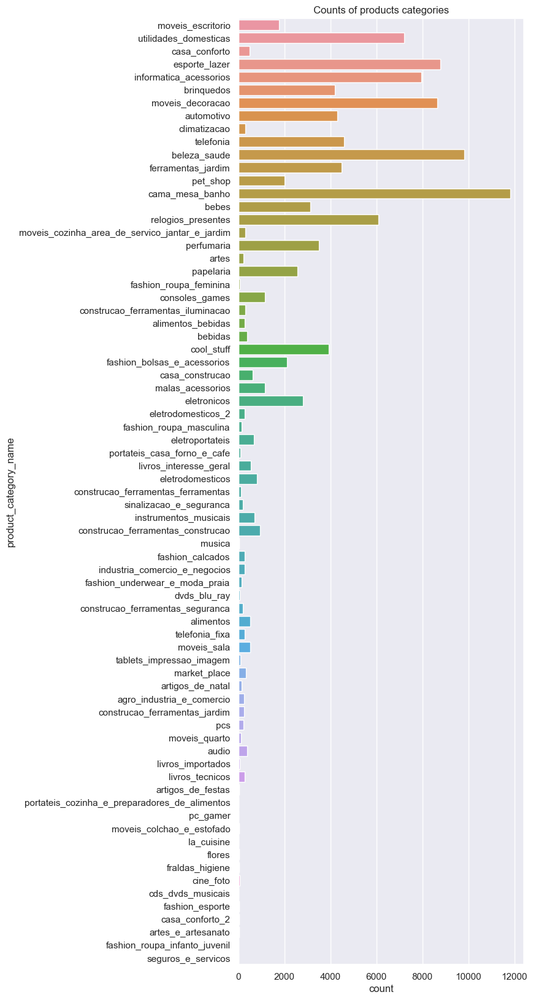

In [40]:
# Number of categories
print("There are " + str(global_df['product_category_name'].nunique()) + " different products categories.")

# Display counts of product category names
display_countplot(global_df, y='product_category_name', title='Counts of products categories', figsize=(6, 20))

First I create a dictionary from the translation dataset.

Then I replace the product categories by their translation by using the dictionary.

[('beleza_saude', 'health_beauty'), ('informatica_acessorios', 'computers_accessories'), ('automotivo', 'auto'), ('cama_mesa_banho', 'bed_bath_table'), ('moveis_decoracao', 'furniture_decor')]


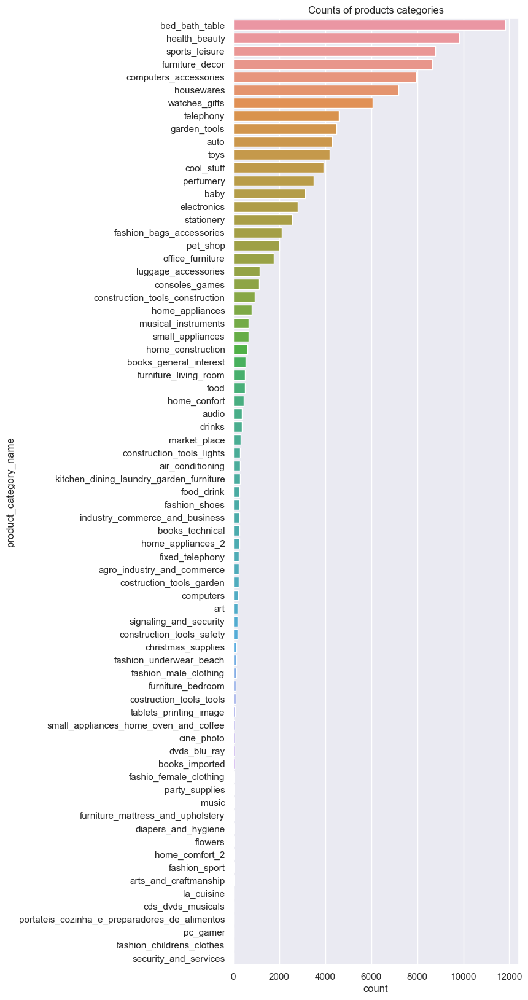

In [41]:
# Create product translation dictionary
product_translation_dict = translation_data.set_index('product_category_name').to_dict()['product_category_name_english']

print(list(product_translation_dict.items())[:5])

# Replace product categories with the dictionary
global_df['product_category_name'] = global_df['product_category_name'].replace(product_translation_dict)

# Display ordered counts of product category names
display_countplot(global_df, y='product_category_name', title='Counts of products categories', figsize=(6, 20),
                  order=global_df['product_category_name'].value_counts().sort_values(ascending=False).index)

Now I want to reduce the number of product categories.

I create another dictionary with new more general categories.

In [42]:
# Dictionary with the new product type categories
product_type_dict = {

    # Arts
    'arts': ['stationery', 'musical_instruments', 'art', 'arts_and_craftmanship'],

    # Automotive
    'automotive': ['auto'],

    # Baby
    'baby': ['baby', 'diapers_and_hygiene'],

    # Beauty
    'beauty': ['health_beauty', 'perfumery'],

    # Books, music and movies
    'books_music_movies': ['books_general_interest', 'books_technical', 'books_imported', 'cine_photo', 'dvds_blu_ray', 'music', 'cds_dvds_musicals'],

    # Electronics
    'electronics': ['computers_accessories', 'computers', 'pc_gamer', 'telephony', 'electronics', 'audio',
                    'fixed_telephony', 'tablets_printing_image'],

    # Fashion
    'fashion': ['watches_gifts', 'fashion_bags_accessories', 'fashion_shoes', 'fashion_underwear_beach',
                'fashion_male_clothing', 'fashio_female_clothing', 'fashion_sport', 'fashion_childrens_clothes',
                'luggage', 'luggage_accessories'],

    # Food and drinks
    'food': ['food', 'drinks', 'food_drink'],

    # Home
    'home': ['bed_bath_table', 'furniture_decor', 'housewares', 'garden_tools', 'home_appliances', 'small_appliances',
             'home_construction', 'furniture_living_room', 'home_confort', 'air_conditioning', 'la_cuisine',
             'kitchen_dining_laundry_garden_furniture', 'home_appliances_2', 'furniture_bedroom', 'home_comfort_2',
             'small_appliances_home_oven_and_coffee', 'furniture_mattress_and_upholstery',
             'office_furniture', 'portateis_cozinha_e_preparadores_de_alimentos'],

    # Construction
    'construction': ['construction_tools_construction', 'construction_tools_lights', 'costruction_tools_garden',
                     'signaling_and_security', 'construction_tools_safety', 'costruction_tools_tools'],

    # Pets
    'pets': ['pet_shop'],

    # Sports
    'sports': ['sports_leisure'],

    # Games
    'games': ['sports_leisure', 'toys', 'consoles_games'],

    # Industry
    'industry': ['industry_commerce_and_business', 'agro_industry_and_commerce'],

    # Other
    'other': ['cool_stuff', 'market_place', 'christmas_supplies', 'party_supplies', 'flowers', 'security_and_services']

}

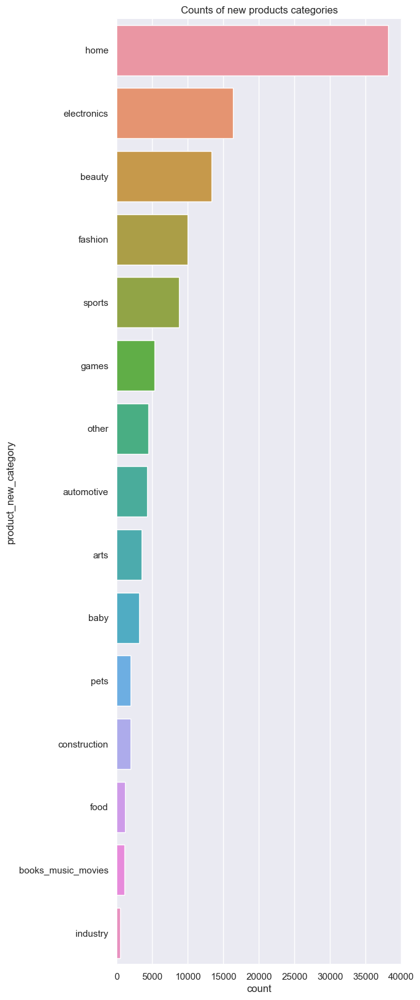

In [43]:
# Create new column name
new_category_col = 'product_new_category'

# Store new categories on new column
global_df[new_category_col] = global_df['product_category_name'].apply(apply_new_category, **product_type_dict)

# Display new column
display_countplot(global_df, y=new_category_col, title='Counts of new products categories', figsize=(6, 20),
                  order=global_df[new_category_col].value_counts().sort_values(ascending=False).index)

Now I decide to encode the categories as new variables.

In [44]:
# Encode new product categories
global_df = pd.get_dummies(global_df, prefix=['product'], columns=[new_category_col])

display(global_df.sample(5))

,customer_unique_id,order_id,order_date,order_estimated_delivery_days,review_score,review_answer_days,payment_id,payment_type,payment_installments,payment_value,...,product_construction,product_electronics,product_fashion,product_food,product_games,product_home,product_industry,product_other,product_pets,product_sports
105745,36f4a6bafecf195e099459d6c172a8d5,ef82fc4c2d59e67b942de26791b617c9,2017-09-22 06:08:45,27,5.0,1.0,1.0,credit_card,6.0,177.48,...,0,1,0,0,0,0,0,0,0,0
104363,360bd75a5eb239fcf08f8d25f9d430e5,c31f5afc2aa6a048ea1d0f84afd0b762,2017-10-11 11:41:40,12,1.0,5.0,1.0,credit_card,10.0,333.86,...,0,0,0,0,0,0,0,1,0,0
104934,50069df36b6b311365d95cfdb8732387,49b689eeebb45115d1a871b368692412,2017-09-25 16:33:05,14,2.0,2.0,1.0,boleto,1.0,20.77,...,0,0,1,0,0,0,0,0,0,0
4455,42b638e50b361535a6e3a20a7eb93be6,48fdee20557eb297d2cfecd7df1a82e2,2018-03-11 22:10:16,23,5.0,0.0,1.0,credit_card,4.0,130.65,...,0,0,0,0,1,0,0,0,0,0
3089,fae50349197fd922f4487e4000e2112c,d2e15d8894685652160e7545fd304610,2017-12-07 21:14:24,26,4.0,2.0,1.0,credit_card,4.0,110.19,...,0,0,0,0,0,0,0,0,0,0


Then I remove the *product_category_name* variable.

In [45]:
# Remove payment type variable
global_df = global_df.drop(columns=['product_category_name'], axis=1)

### Payments types

Let's check the values of the variable *payment_type*.

There are 4 different payments types.


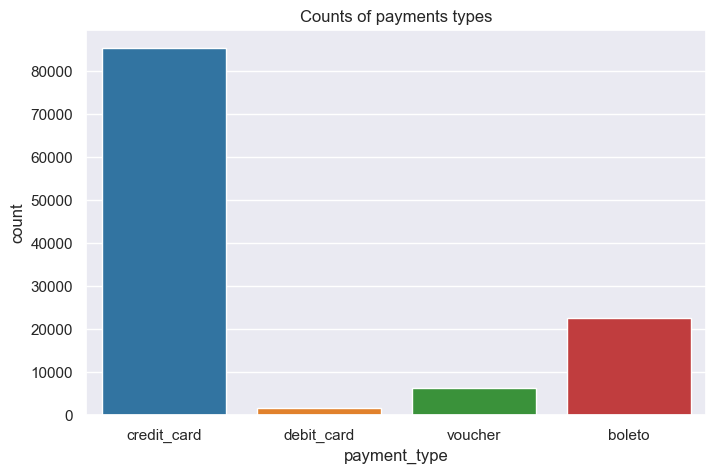

In [46]:
# Number of categories
print("There are " + str(global_df['payment_type'].nunique()) + " different payments types.")

# Display counts of product category names
display_countplot(global_df, x='payment_type', title='Counts of payments types', figsize=(8, 5))

I decide to create three new variable :
* *payment_by_credit* : order value payed by credit card
* *payment_by_voucher* : order value payed by voucher
* *payment_by_boleto* : order value payed by boleto (bank tickets)

(Missing value would automatically be payed by debit card)

In [47]:
# Create new payment variables
global_df['payment_by_credit'] = global_df.apply(apply_payment_type_value, payment_type='credit_card', axis=1)
global_df['payment_by_voucher'] = global_df.apply(apply_payment_type_value, payment_type='voucher', axis=1)
global_df['payment_by_boleto'] = global_df.apply(apply_payment_type_value, payment_type='boleto', axis=1)

display(global_df.head(5))

,customer_unique_id,order_id,order_date,order_estimated_delivery_days,review_score,review_answer_days,payment_id,payment_type,payment_installments,payment_value,...,product_food,product_games,product_home,product_industry,product_other,product_pets,product_sports,payment_by_credit,payment_by_voucher,payment_by_boleto
0,861eff4711a542e4b93843c6dd7febb0,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,19,4.0,4.0,1.0,credit_card,2.0,146.87,...,0,0,1,0,0,0,0,146.87,0.0,0.0
1,290c77bc529b7ac935b93aa66c333dc3,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,24,5.0,11.0,1.0,credit_card,8.0,335.48,...,0,0,1,0,0,0,0,335.48,0.0,0.0
2,060e732b5b29e8181a18229c7b0b2b5e,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,24,5.0,0.0,1.0,credit_card,7.0,157.73,...,0,0,1,0,0,0,0,157.73,0.0,0.0
3,259dac757896d24d7702b9acbbff3f3c,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,27,5.0,4.0,1.0,credit_card,1.0,173.30,...,0,0,1,0,0,0,0,173.30,0.0,0.0
4,345ecd01c38d18a9036ed96c73b8d066,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,16,5.0,7.0,1.0,credit_card,8.0,252.25,...,0,0,1,0,0,0,0,252.25,0.0,0.0


I remove the *payment_type* variable now it is encoded.

In [48]:
# Remove payment type variable
global_df = global_df.drop(columns=['payment_type'], axis=1)

## Clean dataframe

### Duplicates

I check for duplicates in the global dataframe.

In [49]:
# Check for global duplicates
global_duplicates = global_df.duplicated()
print(str(global_df[global_duplicates].size) + " duplicates found in the global dataframe.")

display(global_df[global_duplicates].head(5))

5472 duplicates found in the global dataframe.


,customer_unique_id,order_id,order_date,order_estimated_delivery_days,review_score,review_answer_days,payment_id,payment_installments,payment_value,order_item_id,...,product_food,product_games,product_home,product_industry,product_other,product_pets,product_sports,payment_by_credit,payment_by_voucher,payment_by_boleto
495,b09f1bff1aff13c997af071602bc048b,c27cd942c2a926d25153090afa106ceb,2017-06-15 14:26:01,24,5.0,0.0,1.0,2.0,206.36,1,...,0,0,1,0,0,0,0,206.36,0.0,0.0
496,b09f1bff1aff13c997af071602bc048b,c27cd942c2a926d25153090afa106ceb,2017-06-15 14:26:01,24,5.0,0.0,1.0,2.0,206.36,2,...,0,0,1,0,0,0,0,206.36,0.0,0.0
497,b09f1bff1aff13c997af071602bc048b,c27cd942c2a926d25153090afa106ceb,2017-06-15 14:26:01,24,5.0,0.0,1.0,2.0,206.36,3,...,0,0,1,0,0,0,0,206.36,0.0,0.0
498,b09f1bff1aff13c997af071602bc048b,c27cd942c2a926d25153090afa106ceb,2017-06-15 14:26:01,24,5.0,0.0,1.0,2.0,206.36,4,...,0,0,1,0,0,0,0,206.36,0.0,0.0
598,63df651d5e8adb6a0e4baeb66a0eea37,bbf6a647ecc68aa5e79d2cd75ef44c68,2017-09-01 10:33:16,20,5.0,1.0,1.0,4.0,46.84,1,...,0,0,0,0,0,0,0,46.84,0.0,0.0


I decide to remove the duplicates.

In [50]:
# Remove duplicates
global_df = global_df.drop_duplicates()

### Missing values

Display of variables missing data :

There are 0.12% missing values.


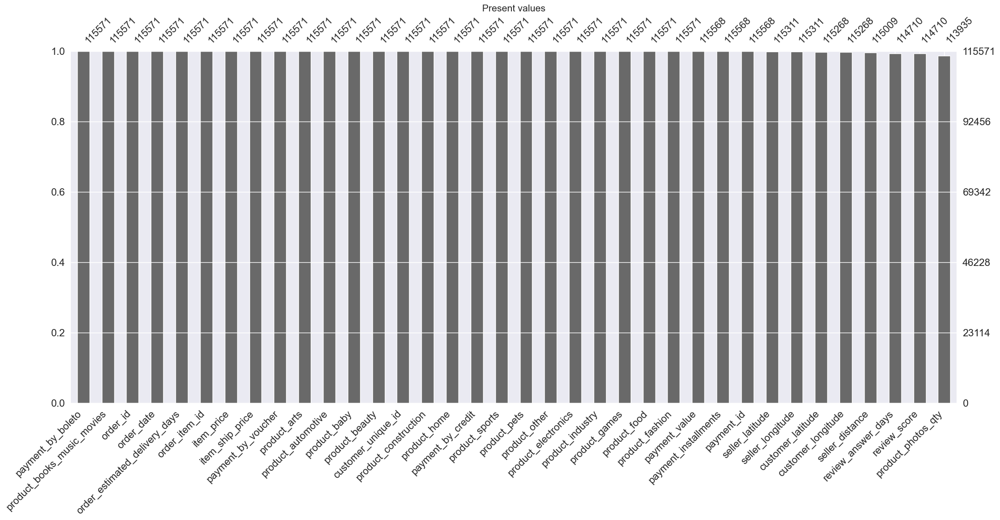

In [51]:
# Number of missing values 
print("There are {0:.2%} missing values.".format(global_df.isna().sum().sum()/global_df.size))

# Disaply missing values
barchart = msno.bar(global_df, sort="descending")
barchart.set_title("Present values", fontsize=15)
plt.show()

I decide to remove the 0.12% missing values.

In [52]:
# Remove NaN values
global_df = global_df.dropna()

# Grouped dataframe

First I group the dataframe by **customer unique ids**, **order ids** and **payment ids** and do special operation on each column.

In [53]:
# Groupby customer, order and payment ids
payment_grouped_df = global_df.groupby(['customer_unique_id', 'order_id', 'payment_id'], as_index=False).agg(
    # Orders
    order_date=pd.NamedAgg(column='order_date', aggfunc='first'),
    order_estimated_delivery_days=pd.NamedAgg(column='order_estimated_delivery_days', aggfunc='first'),
    # Payments
    payment_installments=pd.NamedAgg(column='payment_installments', aggfunc='first'),
    payment_value=pd.NamedAgg(column='payment_value', aggfunc='first'),
    payment_by_credit=pd.NamedAgg(column='payment_by_credit', aggfunc='first'),
    payment_by_voucher=pd.NamedAgg(column='payment_by_voucher', aggfunc='first'),
    payment_by_boleto=pd.NamedAgg(column='payment_by_boleto', aggfunc='first'),
    # Items
    items_number=pd.NamedAgg(column='item_price', aggfunc='count'),
    items_price_mean=pd.NamedAgg(column='item_price', aggfunc='mean'),
    items_price_max=pd.NamedAgg(column='item_price', aggfunc='max'),
    items_ship_mean=pd.NamedAgg(column='item_ship_price', aggfunc='mean'),
    items_ship_max=pd.NamedAgg(column='item_ship_price', aggfunc='max'),
    items_photos_mean=pd.NamedAgg(column='product_photos_qty', aggfunc='mean'),
    products_arts=pd.NamedAgg(column='product_arts', aggfunc='sum'),
    products_automotive=pd.NamedAgg(column='product_automotive', aggfunc='sum'),
    products_baby=pd.NamedAgg(column='product_baby', aggfunc='sum'),
    products_beauty=pd.NamedAgg(column='product_beauty', aggfunc='sum'),
    products_books_music_movies=pd.NamedAgg(column='product_books_music_movies', aggfunc='sum'),
    products_construction=pd.NamedAgg(column='product_construction', aggfunc='sum'),
    products_electronics=pd.NamedAgg(column='product_electronics', aggfunc='sum'),
    products_fashion=pd.NamedAgg(column='product_fashion', aggfunc='sum'),
    products_food=pd.NamedAgg(column='product_food', aggfunc='sum'),
    products_games=pd.NamedAgg(column='product_games', aggfunc='sum'),
    products_home=pd.NamedAgg(column='product_home', aggfunc='sum'),
    products_industry=pd.NamedAgg(column='product_industry', aggfunc='sum'),
    products_other=pd.NamedAgg(column='product_other', aggfunc='sum'),
    products_pets=pd.NamedAgg(column='product_pets', aggfunc='sum'),
    products_sports=pd.NamedAgg(column='product_sports', aggfunc='sum'),
    # Review
    review_score=pd.NamedAgg(column='review_score', aggfunc='first'),
    review_answer_days=pd.NamedAgg(column='review_answer_days', aggfunc='first'),
    # Geolocation
    customer_latitude=pd.NamedAgg(column='customer_latitude', aggfunc='first'),
    customer_longitude=pd.NamedAgg(column='customer_longitude', aggfunc='first'),
    seller_latitude=pd.NamedAgg(column='seller_latitude', aggfunc='first'),
    seller_longitude=pd.NamedAgg(column='seller_longitude', aggfunc='first'),
    seller_distance=pd.NamedAgg(column='seller_distance', aggfunc='first'),
)

display(payment_grouped_df.head(5))

,customer_unique_id,order_id,payment_id,order_date,order_estimated_delivery_days,payment_installments,payment_value,payment_by_credit,payment_by_voucher,payment_by_boleto,...,products_other,products_pets,products_sports,review_score,review_answer_days,customer_latitude,customer_longitude,seller_latitude,seller_longitude,seller_distance
0,0000366f3b9a7992bf8c76cfdf3221e2,e22acc9c116caa3f2b7121bbb380d08e,1.0,2018-05-10 10:56:27,10,8.0,141.90,141.90,0.0,0.0,...,0,0,0,5.0,4.0,-23.340235,-46.830140,-22.708702,-47.664701,1.105686e+05
1,0000b849f77a49e4a4ce2b2a4ca5be3f,3594e05a005ac4d06a72673270ef9ec9,1.0,2018-05-07 11:11:27,7,1.0,27.19,27.19,0.0,0.0,...,0,0,0,4.0,0.0,-23.559115,-46.787626,-23.490759,-46.583369,2.216833e+04
2,0000f46a3911fa3c0805444483337064,b33ec3b699337181488304f362a6b734,1.0,2017-03-10 21:05:03,27,8.0,86.22,86.22,0.0,0.0,...,0,0,0,3.0,1.0,-27.542880,-48.633426,-23.211746,-46.762875,5.169388e+05
3,0000f6ccb0745a6a4b88665a16c9f078,41272756ecddd9a9ed0180413cc22fb6,1.0,2017-10-12 20:29:41,31,4.0,43.62,43.62,0.0,0.0,...,0,0,0,4.0,1.0,-1.312214,-48.483159,-23.543150,-46.490101,2.481287e+06
4,0004aac84e0df4da2b147fca70cf8255,d957021f1127559cd947b62533f484f7,1.0,2017-11-14 19:45:42,20,6.0,196.89,196.89,0.0,0.0,...,0,0,0,5.0,4.0,-23.505548,-47.469705,-23.302318,-45.971888,1.545079e+05


Then I group the dataframe by **customer unique ids** and **order ids**.

In [54]:
# Groupby customer and order ids
order_grouped_df = payment_grouped_df.groupby(['customer_unique_id', 'order_id'], as_index=False).agg(
    # Orders
    order_date=pd.NamedAgg(column='order_date', aggfunc='first'),
    order_estimated_delivery_days=pd.NamedAgg(column='order_estimated_delivery_days', aggfunc='first'),
    # Payments
    payments_istlm_mean=pd.NamedAgg(column='payment_installments', aggfunc='mean'),
    payments_value_mean=pd.NamedAgg(column='payment_value', aggfunc='mean'),
    payments_value_max=pd.NamedAgg(column='payment_value', aggfunc='max'),
    payments_value_std=pd.NamedAgg(column='payment_value', aggfunc='std'),
    payments_value_sum=pd.NamedAgg(column='payment_value', aggfunc='sum'),
    payments_by_credit=pd.NamedAgg(column='payment_by_credit', aggfunc='sum'),
    payments_by_voucher=pd.NamedAgg(column='payment_by_voucher', aggfunc='sum'),
    payments_by_boleto=pd.NamedAgg(column='payment_by_boleto', aggfunc='sum'),
    # Items
    items_number=pd.NamedAgg(column='items_number', aggfunc='first'),
    items_price_mean=pd.NamedAgg(column='items_price_mean', aggfunc='first'),
    items_price_max=pd.NamedAgg(column='items_price_max', aggfunc='first'),
    items_ship_mean=pd.NamedAgg(column='items_ship_mean', aggfunc='first'),
    items_ship_max=pd.NamedAgg(column='items_ship_max', aggfunc='first'),
    items_photos_mean=pd.NamedAgg(column='items_photos_mean', aggfunc='first'),
    products_arts=pd.NamedAgg(column='products_arts', aggfunc='first'),
    products_automotive=pd.NamedAgg(column='products_automotive', aggfunc='first'),
    products_baby=pd.NamedAgg(column='products_baby', aggfunc='first'),
    products_beauty=pd.NamedAgg(column='products_beauty', aggfunc='first'),
    products_books_music_movies=pd.NamedAgg(column='products_books_music_movies', aggfunc='first'),
    products_construction=pd.NamedAgg(column='products_construction', aggfunc='first'),
    products_electronics=pd.NamedAgg(column='products_electronics', aggfunc='first'),
    products_fashion=pd.NamedAgg(column='products_fashion', aggfunc='first'),
    products_food=pd.NamedAgg(column='products_food', aggfunc='first'),
    products_games=pd.NamedAgg(column='products_games', aggfunc='first'),
    products_home=pd.NamedAgg(column='products_home', aggfunc='first'),
    products_industry=pd.NamedAgg(column='products_industry', aggfunc='first'),
    products_other=pd.NamedAgg(column='products_other', aggfunc='first'),
    products_pets=pd.NamedAgg(column='products_pets', aggfunc='first'),
    products_sports=pd.NamedAgg(column='products_sports', aggfunc='first'),
    # Review
    review_score=pd.NamedAgg(column='review_score', aggfunc='first'),
    review_answer_days=pd.NamedAgg(column='review_answer_days', aggfunc='first'),
    # Geolocation
    customer_latitude=pd.NamedAgg(column='customer_latitude', aggfunc='first'),
    customer_longitude=pd.NamedAgg(column='customer_longitude', aggfunc='first'),
    seller_latitude=pd.NamedAgg(column='seller_latitude', aggfunc='first'),
    seller_longitude=pd.NamedAgg(column='seller_longitude', aggfunc='first'),
    seller_distance=pd.NamedAgg(column='seller_distance', aggfunc='first'),
)

display(order_grouped_df.head(5))

,customer_unique_id,order_id,order_date,order_estimated_delivery_days,payments_istlm_mean,payments_value_mean,payments_value_max,payments_value_std,payments_value_sum,payments_by_credit,...,products_other,products_pets,products_sports,review_score,review_answer_days,customer_latitude,customer_longitude,seller_latitude,seller_longitude,seller_distance
0,0000366f3b9a7992bf8c76cfdf3221e2,e22acc9c116caa3f2b7121bbb380d08e,2018-05-10 10:56:27,10,8.0,141.90,141.90,NaN,141.90,141.90,...,0,0,0,5.0,4.0,-23.340235,-46.830140,-22.708702,-47.664701,1.105686e+05
1,0000b849f77a49e4a4ce2b2a4ca5be3f,3594e05a005ac4d06a72673270ef9ec9,2018-05-07 11:11:27,7,1.0,27.19,27.19,NaN,27.19,27.19,...,0,0,0,4.0,0.0,-23.559115,-46.787626,-23.490759,-46.583369,2.216833e+04
2,0000f46a3911fa3c0805444483337064,b33ec3b699337181488304f362a6b734,2017-03-10 21:05:03,27,8.0,86.22,86.22,NaN,86.22,86.22,...,0,0,0,3.0,1.0,-27.542880,-48.633426,-23.211746,-46.762875,5.169388e+05
3,0000f6ccb0745a6a4b88665a16c9f078,41272756ecddd9a9ed0180413cc22fb6,2017-10-12 20:29:41,31,4.0,43.62,43.62,NaN,43.62,43.62,...,0,0,0,4.0,1.0,-1.312214,-48.483159,-23.543150,-46.490101,2.481287e+06
4,0004aac84e0df4da2b147fca70cf8255,d957021f1127559cd947b62533f484f7,2017-11-14 19:45:42,20,6.0,196.89,196.89,NaN,196.89,196.89,...,0,0,0,5.0,4.0,-23.505548,-47.469705,-23.302318,-45.971888,1.545079e+05


Finally I group the dataframe by **customer unique ids**.

In [55]:
# Use latest order date as now
date_now = order_grouped_df['order_date'].max()
print(date_now)

# Groupby customer ids
customer_grouped_df = order_grouped_df.groupby(['customer_unique_id']).agg(
    # Orders
    orders_number=pd.NamedAgg(column='order_date', aggfunc='count'),
    orders_days_since_last=pd.NamedAgg(column='order_date', aggfunc=lambda x: (date_now - x.max()).days),
    orders_estimated_days_mean=pd.NamedAgg(column='order_estimated_delivery_days', aggfunc='mean'),
    orders_estimated_days_max=pd.NamedAgg(column='order_estimated_delivery_days', aggfunc='max'),
    # Payments
    payments_istlm_mean=pd.NamedAgg(column='payments_istlm_mean', aggfunc='mean'),
    payments_value_mean=pd.NamedAgg(column='payments_value_sum', aggfunc='mean'),
    payments_value_max=pd.NamedAgg(column='payments_value_max', aggfunc='max'),
    payments_value_std=pd.NamedAgg(column='payments_value_sum', aggfunc='std'),
    payments_value_sum=pd.NamedAgg(column='payments_value_sum', aggfunc='sum'),
    payments_by_credit=pd.NamedAgg(column='payments_by_credit', aggfunc='sum'),
    payments_by_voucher=pd.NamedAgg(column='payments_by_voucher', aggfunc='sum'),
    payments_by_boleto=pd.NamedAgg(column='payments_by_boleto', aggfunc='sum'),
    # Items
    items_number_mean=pd.NamedAgg(column='items_number', aggfunc='mean'),
    items_price_mean=pd.NamedAgg(column='items_price_mean', aggfunc='mean'),
    items_price_max=pd.NamedAgg(column='items_price_max', aggfunc='max'),
    items_price_std=pd.NamedAgg(column='items_price_mean', aggfunc='std'),
    items_ship_mean=pd.NamedAgg(column='items_ship_mean', aggfunc='mean'),
    items_ship_max=pd.NamedAgg(column='items_ship_max', aggfunc='max'),
    items_photos_mean=pd.NamedAgg(column='items_photos_mean', aggfunc='mean'),
    products_arts=pd.NamedAgg(column='products_arts', aggfunc='sum'),
    products_automotive=pd.NamedAgg(column='products_automotive', aggfunc='sum'),
    products_baby=pd.NamedAgg(column='products_baby', aggfunc='sum'),
    products_beauty=pd.NamedAgg(column='products_beauty', aggfunc='sum'),
    products_books_music_movies=pd.NamedAgg(column='products_books_music_movies', aggfunc='sum'),
    products_construction=pd.NamedAgg(column='products_construction', aggfunc='sum'),
    products_electronics=pd.NamedAgg(column='products_electronics', aggfunc='sum'),
    products_fashion=pd.NamedAgg(column='products_fashion', aggfunc='sum'),
    products_food=pd.NamedAgg(column='products_food', aggfunc='sum'),
    products_games=pd.NamedAgg(column='products_games', aggfunc='sum'),
    products_home=pd.NamedAgg(column='products_home', aggfunc='sum'),
    products_industry=pd.NamedAgg(column='products_industry', aggfunc='sum'),
    products_other=pd.NamedAgg(column='products_other', aggfunc='sum'),
    products_pets=pd.NamedAgg(column='products_pets', aggfunc='sum'),
    products_sports=pd.NamedAgg(column='products_sports', aggfunc='sum'),
    # Review
    review_score_mean=pd.NamedAgg(column='review_score', aggfunc='mean'),
    review_answer_mean=pd.NamedAgg(column='review_answer_days', aggfunc='mean'),
    # Geolocation
    customer_latitude=pd.NamedAgg(column='customer_latitude', aggfunc='first'),
    customer_longitude=pd.NamedAgg(column='customer_longitude', aggfunc='first'),
    seller_latitude_top=pd.NamedAgg(column='seller_latitude', aggfunc=lambda x: x.mode()[0]),
    seller_longitude_top=pd.NamedAgg(column='seller_longitude', aggfunc=lambda x: x.mode()[0]),
    seller_distance_mean=pd.NamedAgg(column='seller_distance', aggfunc='mean'),
    seller_distance_max=pd.NamedAgg(column='seller_distance', aggfunc='max'),
)

display(customer_grouped_df.head(10))

2018-08-29 15:00:37


,orders_number,orders_days_since_last,orders_estimated_days_mean,orders_estimated_days_max,payments_istlm_mean,payments_value_mean,payments_value_max,payments_value_std,payments_value_sum,payments_by_credit,...,products_pets,products_sports,review_score_mean,review_answer_mean,customer_latitude,customer_longitude,seller_latitude_top,seller_longitude_top,seller_distance_mean,seller_distance_max
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,1,111,10.0,10,8.0,141.90,141.90,NaN,141.90,141.90,...,0,0,5.0,4.0,-23.340235,-46.830140,-22.708702,-47.664701,1.105686e+05,1.105686e+05
0000b849f77a49e4a4ce2b2a4ca5be3f,1,114,7.0,7,1.0,27.19,27.19,NaN,27.19,27.19,...,0,0,4.0,0.0,-23.559115,-46.787626,-23.490759,-46.583369,2.216833e+04,2.216833e+04
0000f46a3911fa3c0805444483337064,1,536,27.0,27,8.0,86.22,86.22,NaN,86.22,86.22,...,0,0,3.0,1.0,-27.542880,-48.633426,-23.211746,-46.762875,5.169388e+05,5.169388e+05
0000f6ccb0745a6a4b88665a16c9f078,1,320,31.0,31,4.0,43.62,43.62,NaN,43.62,43.62,...,0,0,4.0,1.0,-1.312214,-48.483159,-23.543150,-46.490101,2.481287e+06,2.481287e+06
0004aac84e0df4da2b147fca70cf8255,1,287,20.0,20,6.0,196.89,196.89,NaN,196.89,196.89,...,0,0,5.0,4.0,-23.505548,-47.469705,-23.302318,-45.971888,1.545079e+05,1.545079e+05
0004bd2a26a76fe21f786e4fbd80607f,1,145,13.0,13,8.0,166.98,166.98,NaN,166.98,166.98,...,0,0,4.0,2.0,-23.515676,-46.688233,-23.700198,-46.513128,2.718987e+04,2.718987e+04
00050ab1314c0e55a6ca13cf7181fecf,1,131,18.0,18,1.0,35.38,35.38,NaN,35.38,0.00,...,0,0,4.0,3.0,-22.823421,-47.087193,-23.625475,-46.612000,1.015461e+05,1.015461e+05
00053a61a98854899e70ed204dd4bafe,1,182,25.0,25,3.0,419.18,419.18,NaN,419.18,419.18,...,0,2,1.0,0.0,-25.431323,-49.279219,-21.112713,-47.790810,5.036840e+05,5.036840e+05
0005e1862207bf6ccc02e4228effd9a0,1,542,32.0,32,3.0,150.12,150.12,NaN,150.12,150.12,...,0,0,4.0,6.0,-22.401371,-42.991002,-21.693371,-45.259769,2.467205e+05,2.467205e+05


# Customer dataframe exploration

Let's analyze the customer grouped dataframe.

In [56]:
# Customer dataframe info
display(customer_grouped_df.describe().T)

,count,mean,std,min,25%,50%,75%,max
orders_number,91053.0,1.032772,0.205902,1.000000,1.000000,1.000000,1.000000,1.400000e+01
orders_days_since_last,91053.0,236.085478,152.654153,0.000000,113.000000,217.000000,344.000000,6.940000e+02
orders_estimated_days_mean,91053.0,23.352934,8.731928,2.000000,18.000000,23.000000,28.000000,1.550000e+02
orders_estimated_days_max,91053.0,23.450441,8.808241,2.000000,18.000000,23.000000,28.000000,1.550000e+02
payments_istlm_mean,91053.0,2.901608,2.677899,0.000000,1.000000,2.000000,4.000000,2.400000e+01
payments_value_mean,91053.0,160.287431,218.421798,9.590000,62.340000,105.370000,176.980000,1.366408e+04
payments_value_max,91053.0,160.213736,218.519407,4.070000,61.750000,105.160000,177.370000,1.366408e+04
payments_value_std,2687.0,66.055697,113.276815,0.000000,9.231279,33.057242,76.491276,1.646887e+03
payments_value_sum,91053.0,165.079584,225.161054,9.590000,63.000000,107.580000,182.860000,1.366408e+04
payments_by_credit,91053.0,129.607454,211.891452,0.000000,25.310000,79.230000,158.350000,1.366408e+04


The standard deviation variables *items_price_std* and *payments_value_std* present a lot of missing values due to single value of *item_price* and *payments_value*.

I replace the missing values by zero.

In [57]:
# Replace missing values by zero
customer_grouped_df[['items_price_std', 'payments_value_std']] = customer_grouped_df[['items_price_std', 'payments_value_std']].fillna(0)

I display a heatmap to find any correlation between the variables.

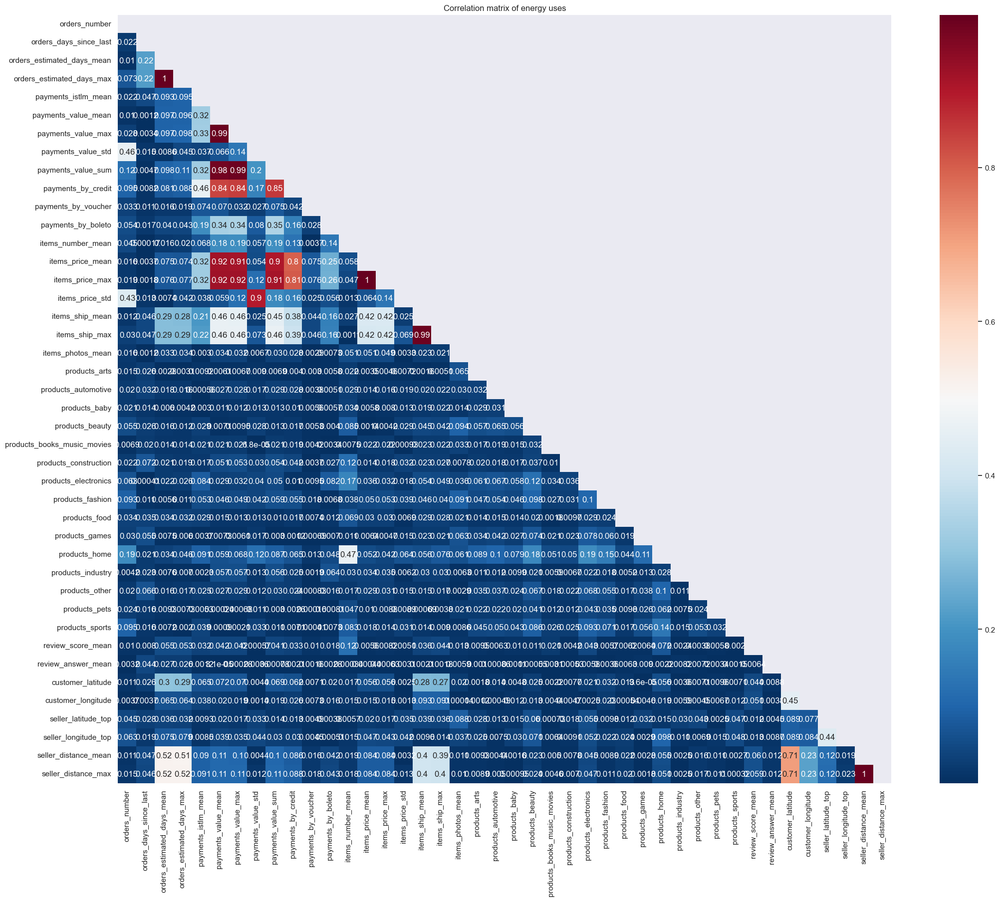

In [58]:
# Create correlation dataframe
corr = customer_grouped_df.corr()

# Display heatmap
display_heatmap(corr, title="Correlation matrix of customer variables", figsize=(25,20))

The correlation matrix shows some strong correlation between :
* *orders_estimated_days_mean* and *orders_estimated_days_max*
* *items_price_mean* and *items_price_max*
* *seller_distance_mean* and *seller_distance_max*
* *items_ship_mean* and *items_ship_max*
* *payments_value_mean* and *payment_value_max*
* *payments_value_sum* and *payment_value_max*

Thus I decide to remove the variable *orders_estimated_days_max*, *items_price_max*, *seller_distance_max*, *items_ship_max* and *payments_value_max* to simplify the study.

In [59]:
# Remove correlated variables
customer_grouped_df = customer_grouped_df.drop(columns=['orders_estimated_days_max', 'items_price_max',
                                                        'seller_distance_max', 'items_ship_max', 'payments_value_max'])

Let's check the distribution of the customer variables.

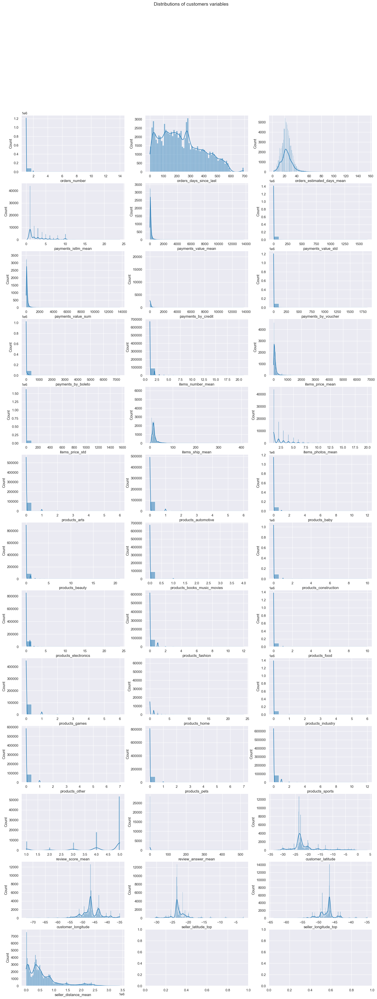

In [60]:
# Display variable distribution
display_multi_histplot(customer_grouped_df, title="Distributions of customers variables", figsize=(20,50))

A lot of variable present a strong skewness. 

I decide to transform some of them (the ones without zeros) by using the logarithm function.

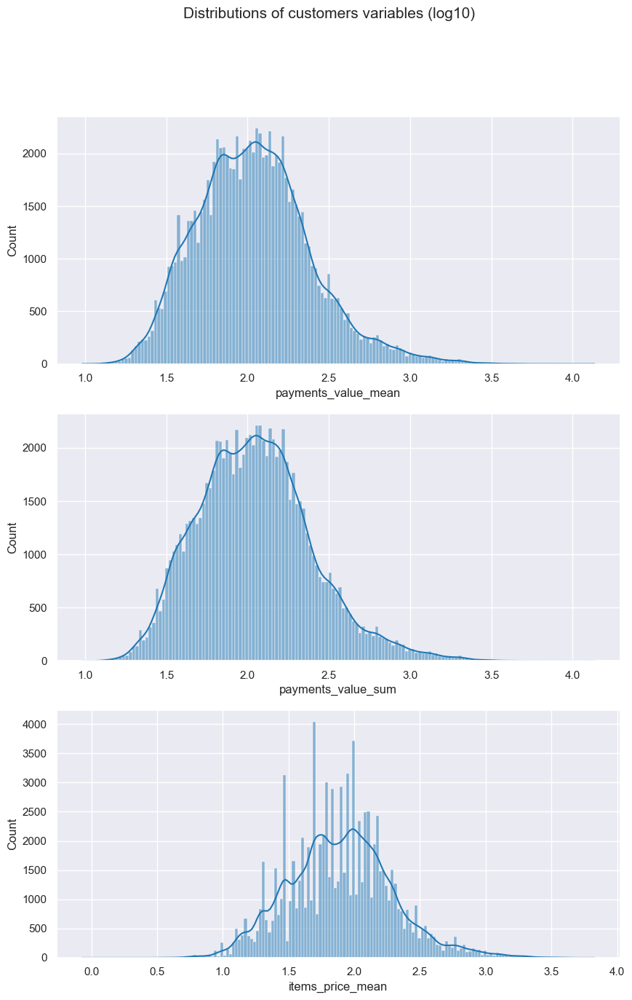

In [61]:
# Select columns to transform
log_columns = ['payments_value_mean', 'payments_value_sum', 'items_price_mean']

# New dataframe
log10_df = customer_grouped_df.copy()

# Compute log10 + 1 (for zeros values)
log10_df[log_columns] = np.log10(customer_grouped_df[log_columns])

display_multi_histplot(log10_df[log_columns], title="Distributions of customers variables (log10)", figsize=(10,15))

# Export

In [62]:
# Customers grouped df
export_cust_df = log10_df.copy()

Export cleaned dataframes to csv files : 

In [63]:
# File name
export_cust_filename = "project5_customer_cleaned.csv"
# File path
export_cust_path = work_path + project_path + "/" + export_cust_filename
# Export dataframe
export_cust_df.to_csv(export_cust_path, index=False)
